In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seir_discrete

%load_ext autoreload
%autoreload 2

## 30 trajectories on 1 plot

- у многих по две волны
- у 0-й траектории в начале есть Infected == 0, но эпидемия начинается
- у 6-й траектории максимум в 25 инфицированных

3 672.0
6 321.0
10 660.0
21 930.0
27 773.0


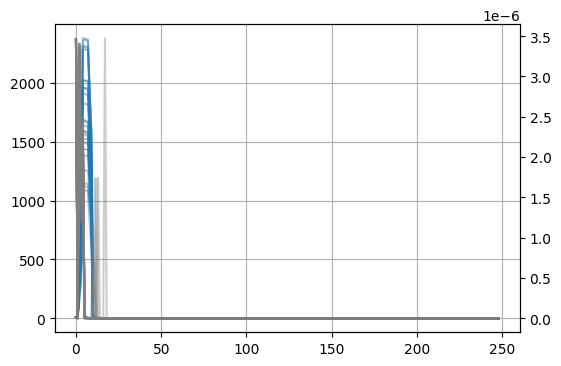

In [3]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

for i in range(30):
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{i}.csv', 
                sep='\t')
    if df_b['I_H1N1'].max() < 1000:
        print(i, df_b['I_H1N1'].max())
    else:
        
        fin = df_b.shape[0]#df_b[df_b['I_H1N1']==0].index[0]
        ax.plot(df_b.I_H1N1[:fin], color='tab:blue', alpha=0.4)

        beta = df_b.beta_H1N1[:fin]
        
        ax_beta.plot(beta, color='gray', alpha=0.4, label='beta from df')
    
    
ax.grid()

(0.0, 20.0)

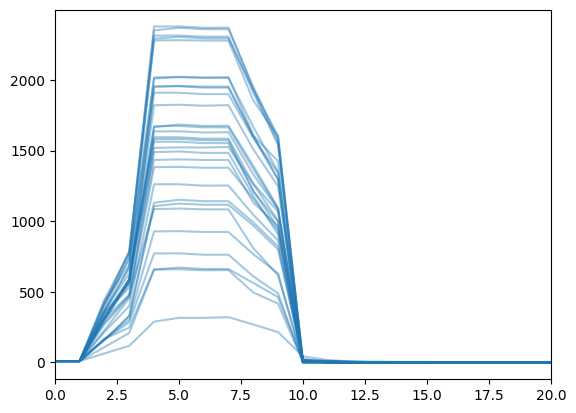

In [12]:
for i in range(30):
    df_b = pd.read_csv(f'samara_about_370k_res/seirb_seed_{i}.csv', 
                sep='\t')
    plt.plot(df_b.I_H1N1, color='tab:blue', alpha=0.4)
plt.xlim(0,20)

In [16]:
df_b.iloc[:20,:4]

,S_H1N1,E_H1N1,I_H1N1,R_H1N1
0,288580.0,423.0,10.0,81516.0
1,288323.0,680.0,10.0,81516.0
2,286733.0,1847.0,433.0,81516.0
3,286731.0,1592.0,690.0,81516.0
4,286724.0,9.0,2280.0,81516.0
5,286724.0,7.0,2282.0,81516.0
6,286724.0,0.0,2279.0,81526.0
7,286724.0,0.0,2279.0,81526.0
8,286724.0,0.0,1856.0,81949.0
9,286724.0,0.0,1599.0,82206.0


(0.0, 20.0)

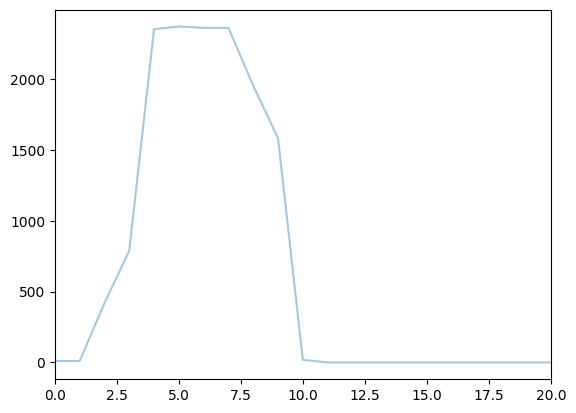

In [11]:
i=5
df_b = pd.read_csv(f'samara_about_370k_res/seirb_seed_{i}.csv', 
                sep='\t')
plt.plot(df_b.I_H1N1, color='tab:blue', alpha=0.4)
plt.xlim(0,20)

6 25.0


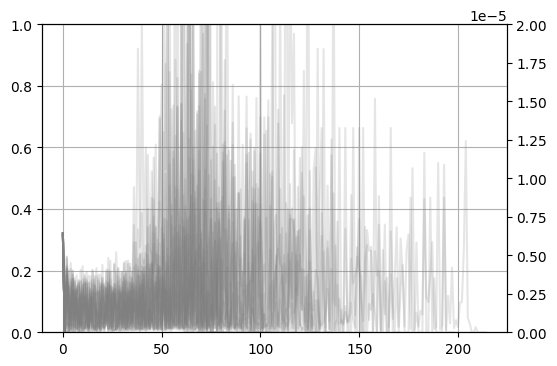

In [5]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

for i in range(30):
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{i}.csv', 
                sep='\t')
    fin = df_b[df_b['I_H1N1']==0].index[0]
    
    if df_b['I_H1N1'].max() < 1000:
        print(i, df_b['I_H1N1'].max())
    else:
        beta = df_b.beta_H1N1[:fin]
        ax_beta.plot(beta, color='gray', alpha=0.2, label='beta from df')
    
ax_beta.set_ylim(0, 2e-5)    
ax.grid()

### recalc beta

6 25.0


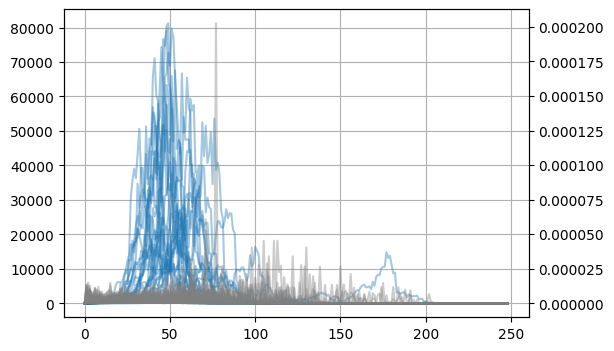

In [2]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

for i in range(30):
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{i}.csv', 
                sep='\t')
    if df_b['I_H1N1'].max() < 1000:
        print(i, df_b['I_H1N1'].max())
    else:
        
        fin = df_b.shape[0]#df_b[df_b['I_H1N1']==0].index[0]
        ax.plot(df_b.I_H1N1[:fin], color='tab:blue', alpha=0.4)
        #betas = df_b.beta_H1N1[:st_day]
        betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
        beta = betas[:fin]
        
        ax_beta.plot(beta, color='gray', alpha=0.4, label='beta from df')
    
    
ax.grid()

6 25.0


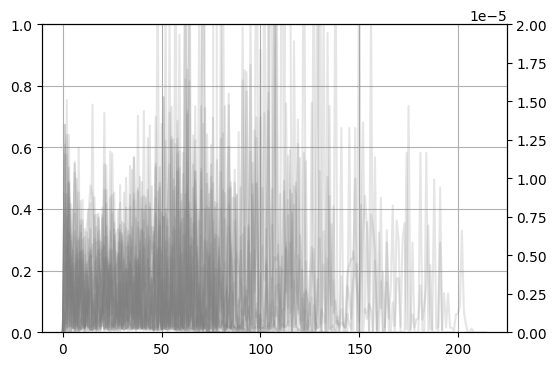

In [3]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

for i in range(30):
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{i}.csv', 
                sep='\t')
    fin = df_b[df_b['I_H1N1']==0].index[0]
    
    if df_b['I_H1N1'].max() < 1000:
        print(i, df_b['I_H1N1'].max())
    else:
        #beta = df_b.beta_H1N1[:fin]
        betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
        beta = betas[:fin]
        ax_beta.plot(beta, color='gray', alpha=0.2, label='beta from df')
    
ax_beta.set_ylim(0, 2e-5)    
ax.grid()

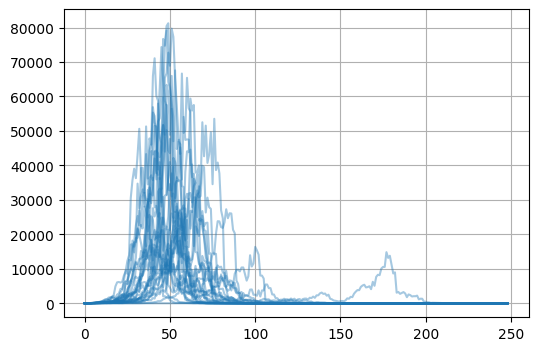

In [4]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

for i in range(30):
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{i}.csv', 
                sep='\t')
    fin = df_b.shape[0]#df_b[df_b['I_H1N1']==0].index[0]
    ax.plot(df_b.I_H1N1[:fin], color='tab:blue', alpha=0.4)
    

ax.grid()

## plots for median ABM Infected and Betas

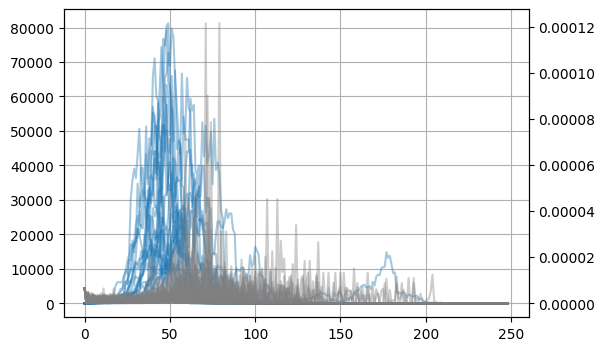

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()
inf_all = pd.DataFrame([])
beta_all = pd.DataFrame([])

for i in range(30):
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{i}.csv', 
                sep='\t')
    
    if df_b['I_H1N1'].max() > 1000:
        inf_all= pd.concat([inf_all, df_b.I_H1N1], axis=1)
        ax.plot(df_b.I_H1N1, color='tab:blue', alpha=0.4)

        beta_all= pd.concat([beta_all, df_b.beta_H1N1], axis=1)
        ax_beta.plot(df_b.beta_H1N1, color='gray', alpha=0.4, label='beta from df')
    
    
ax.grid()

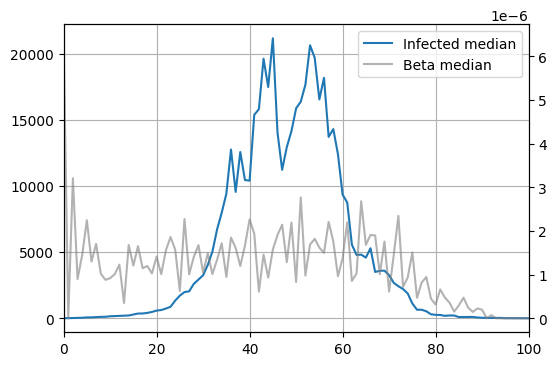

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax.plot(inf_all.median(axis=1), color='tab:blue', 
        label='Infected median')

ax_beta = ax.twinx()
ax_beta.plot(beta_all.median(axis=1), color='gray', 
             alpha=0.6, label='Beta median')

handles, labels = ax.get_legend_handles_labels()
handles_beta, labels_beta = ax_beta.get_legend_handles_labels()
ax.legend(handles + handles_beta, labels + labels_beta)

ax.set_xlim(0, 100)
ax.grid()

### recalc beta

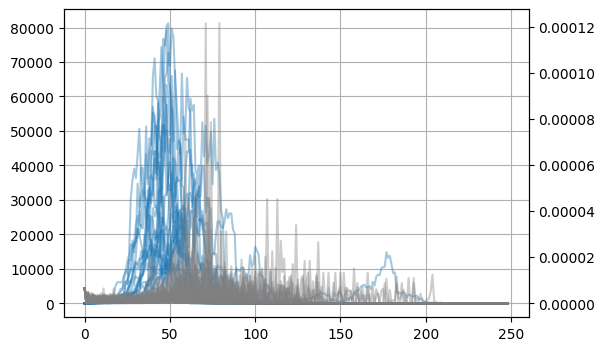

In [5]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()
inf_all = pd.DataFrame([])
S_all = pd.DataFrame([])
E_all = pd.DataFrame([])
R_all = pd.DataFrame([])

beta_all = pd.DataFrame([])

for i in range(30):
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{i}.csv', 
                sep='\t')
    
    if df_b['I_H1N1'].max() > 1000:
        inf_all= pd.concat([inf_all, df_b.I_H1N1], axis=1)
        S_all= pd.concat([S_all, df_b.S_H1N1], axis=1)
        E_all= pd.concat([E_all, df_b.E_H1N1], axis=1)
        R_all= pd.concat([R_all, df_b.R_H1N1], axis=1)
        ax.plot(df_b.I_H1N1, color='tab:blue', alpha=0.4)
        
        betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
        beta_all= pd.concat([beta_all, betas], axis=1)
        ax_beta.plot(df_b.beta_H1N1, color='gray', alpha=0.4, label='beta from df')
    
    
ax.grid()

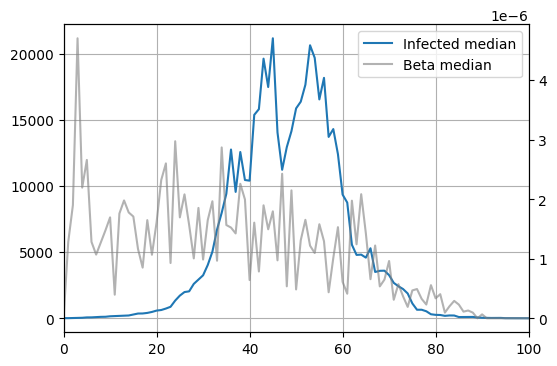

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax.plot(inf_all.median(axis=1), color='tab:blue', 
        label='Infected median')

ax_beta = ax.twinx()
ax_beta.plot(beta_all.median(axis=1), color='gray', 
             alpha=0.6, label='Beta median')

handles, labels = ax.get_legend_handles_labels()
handles_beta, labels_beta = ax_beta.get_legend_handles_labels()
ax.legend(handles + handles_beta, labels + labels_beta)

ax.set_xlim(0, 100)
ax.grid()

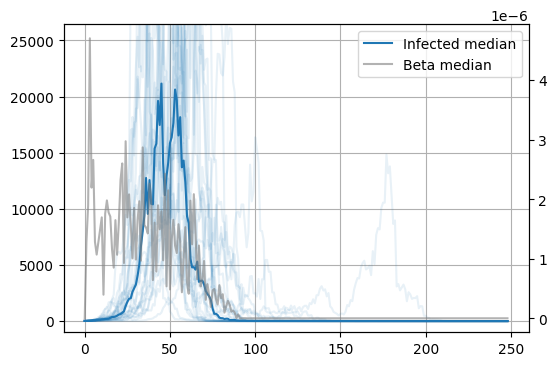

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax.plot(inf_all, alpha=0.1, color='tab:blue')
ax.plot(inf_all.median(axis=1), color='tab:blue', 
        label='Infected median')

ax_beta = ax.twinx()
ax_beta.plot(beta_all.median(axis=1), color='gray', 
             alpha=0.6, label='Beta median')


handles, labels = ax.get_legend_handles_labels()
handles_beta, labels_beta = ax_beta.get_legend_handles_labels()
ax.legend(handles + handles_beta, labels + labels_beta)

ax.set_ylim(-1000, inf_all.median(axis=1).max()*1.25)
#ax.set_xlim(0, 100)
ax.grid()

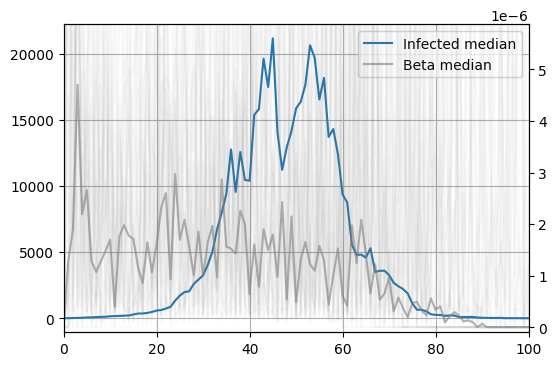

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax.plot(inf_all.median(axis=1), color='tab:blue', 
        label='Infected median')

ax_beta = ax.twinx()
ax_beta.plot(beta_all, color='gray', alpha=0.03)
ax_beta.plot(beta_all.median(axis=1), color='gray', 
             alpha=0.6, label='Beta median')

handles, labels = ax.get_legend_handles_labels()
handles_beta, labels_beta = ax_beta.get_legend_handles_labels()
ax.legend(handles + handles_beta, labels + labels_beta)

ax_beta.set_ylim(-1e-7, beta_all.median(axis=1).max()*1.25)
ax_beta.set_xlim(0, 100)
ax.grid()

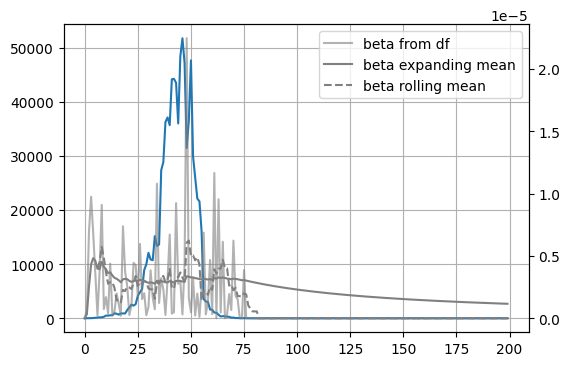

In [12]:
i = 3
df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{i}.csv', 
            sep='\t')

fig, ax = plt.subplots(1, 1, figsize=(6, 4))

fin = 200#df_b[df_b['I_H1N1']==0].index[0]
ax.plot(df_b.I_H1N1[:fin])
ax.grid()

betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)[:fin]
ax_beta = ax.twinx()
ax_beta.plot(betas, color='gray', alpha=0.6, label='beta from df')

beta_expand_m = betas.expanding().mean()
ax_beta.plot(beta_expand_m, color='gray', label='beta expanding mean')

beta_roll_m =betas.rolling(7).mean()
ax_beta.plot(beta_roll_m, color='gray', ls='--', label='beta rolling mean')
#ax_beta.axhline(0.000013)
ax_beta.legend()

## trying SEIR from day 0 with found beta

In [ ]:
'''
Мы не калибруем СЕИР под начальный кусок АБМ.
Мы просто находим бету и подаем ее в СЕИР

мб будем лучше, если подстроим СЕИР под начальный кусок?
т.е. начальная форма согласуется на 100проц
или хотя бы строить СЕИР с 0-го дня, чтобы инф-ия о реальной бете была учтена?
'''

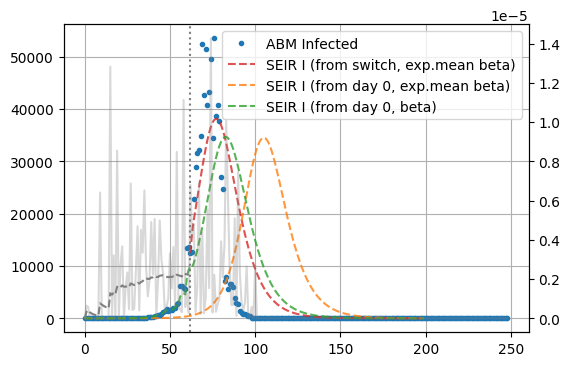

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))


seed = 0
days_before = 14

df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')
fin = 200#df_b[df_b['I_H1N1']==0].index[0]
st_day = df_b.I_H1N1.argmax() - days_before

ax.axvline(st_day, ls=':', color='tab:gray')
#betas = df_b.beta_H1N1.fillna(0)

betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
beta_expand_m = betas[:st_day].expanding().mean()
ax.plot(df_b.I_H1N1, label='ABM Infected', color='tab:blue', marker='.', ls='');

ax_b = ax.twinx()
ax_b.plot(betas, color='gray', alpha=0.3)
ax_b.plot(beta_expand_m, color='gray', ls='--')

# делаем SEIR прогноз
y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)
sigma=1/2
gamma=1/8

S,E,I,R = seir_discrete.seir_model(y0, ts, beta_expand_m.iloc[-1], sigma, gamma, 
                         stype='d', beta_t=False).T
ax.plot(ts+st_day, I, color='tab:red', ls='--', alpha=0.8, 
            label='SEIR I (from switch, exp.mean beta)')

in_days = st_day
in_days = 200
ts = np.arange(in_days)
y0 = df_b.iloc[0,:4].values

# если начало строить на основе реальных бет -- ближе к правде 
expmean = betas.expanding().mean().iloc[:st_day].values
S,E,I,R = seir_discrete.seir_model(y0, ts, 
                                   [*expmean,*[beta_expand_m.iloc[-1]]*(in_days-st_day)], 
                                   sigma, gamma, stype='d', beta_t=True).T
ax.plot(np.arange(in_days), I, color='tab:orange', ls='--', alpha=0.8, 
        label='SEIR I (from day 0, exp.mean beta)')


expmean = betas.iloc[:st_day].values
S,E,I,R = seir_discrete.seir_model(y0, ts, 
                                   [*expmean,*[beta_expand_m.iloc[-1]]*(in_days-st_day)], 
                                   sigma, gamma, stype='d', beta_t=True).T
ax.plot(np.arange(in_days), I, color='tab:green', ls='--', alpha=0.8, 
        label='SEIR I (from day 0, beta)')
ax.legend()
ax.grid()

In [22]:
len([*expmean,*[beta_expand_m.iloc[-1]]*(in_days-st_day)])

138

In [23]:
st_day

62

In [30]:
np.arange(fin-i).shape

(199,)

In [29]:
i

1

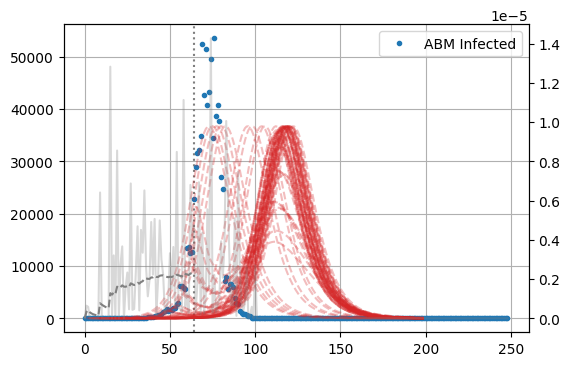

In [38]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

sigma=1/2
gamma=1/8
seed = 0
days_before = 12

df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')
fin = 200#df_b[df_b['I_H1N1']==0].index[0]
st_day = df_b.I_H1N1.argmax() - days_before

ax.axvline(st_day, ls=':', color='tab:gray')

betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)

beta_expand_m = betas[:st_day].expanding().mean()
ax.plot(df_b.I_H1N1, label='ABM Infected', color='tab:blue', marker='.', ls='');

ax_b = ax.twinx()
ax_b.plot(betas, color='gray', alpha=0.3)
ax_b.plot(beta_expand_m, color='gray', ls='--')

for i in range(1,st_day):
    

    # делаем SEIR прогноз
    y0 = df_b.iloc[i,:4].values
    ts = np.arange(fin-i)
    expmean = betas.expanding().mean().iloc[:i].values
    S,E,I,R = seir_discrete.seir_model(y0, ts, 
                                       [*expmean,*[beta_expand_m.iloc[-1]]*(fin-i)], 
                                       sigma, gamma, 
                                       stype='d', beta_t=True).T
    ax.plot(ts+i, I, color='tab:red', ls='--', alpha=0.3)

    ax.legend()
    ax.grid()

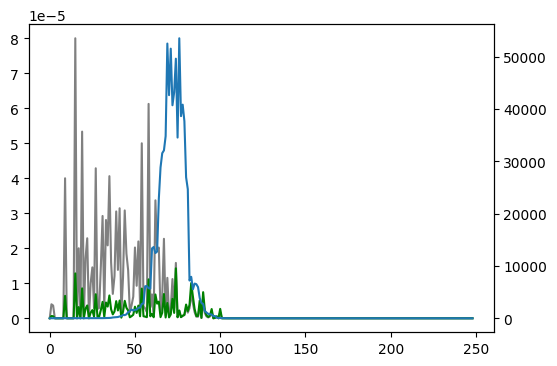

In [51]:
fig, ax = plt.subplots(1,1,figsize=(6,4))
ax.plot((betas / gamma) * (df_b.S_H1N1 / 200000), color='gray')
ax.plot(betas, color='green')
ax_i= ax.twinx()
ax_i.plot(df_b.I_H1N1);

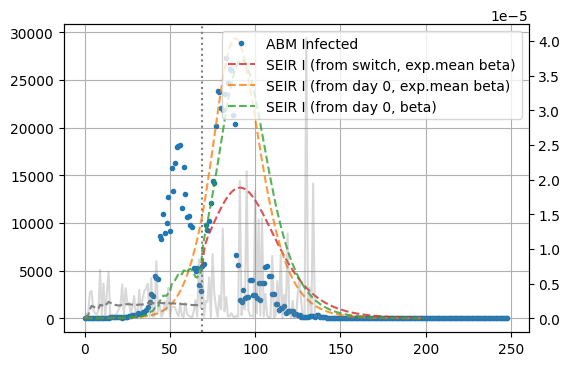

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))


seed = 15
days_before = 14

df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')
fin = 200#df_b[df_b['I_H1N1']==0].index[0]
st_day = df_b.I_H1N1.argmax() - days_before

ax.axvline(st_day, ls=':', color='tab:gray')
#betas = df_b.beta_H1N1.fillna(0)

betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)

beta_expand_m = betas[:st_day].expanding().mean()
ax.plot(df_b.I_H1N1, label='ABM Infected', color='tab:blue', marker='.', ls='');

ax_b = ax.twinx()
ax_b.plot(betas, color='gray', alpha=0.3)
ax_b.plot(beta_expand_m, color='gray', ls='--')

# делаем SEIR прогноз
y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)
sigma=1/2
gamma=1/8

S,E,I,R = seir_discrete.seir_model(y0, ts, beta_expand_m.iloc[-1], sigma, gamma, 
                         stype='d', beta_t=False).T
ax.plot(ts+st_day, I, color='tab:red', ls='--', alpha=0.8, 
            label='SEIR I (from switch, exp.mean beta)')

in_days = st_day
in_days = 200
ts = np.arange(in_days)
y0 = df_b.iloc[0,:4].values

# если начало строить на основе реальных бет -- ближе к правде 
expmean = betas.expanding().mean().iloc[:st_day].values
S,E,I,R = seir_discrete.seir_model(y0, ts, 
                                   [*expmean,*[beta_expand_m.iloc[-1]]*(in_days-st_day)], 
                                   sigma, gamma, stype='d', beta_t=True).T
ax.plot(np.arange(in_days), I, color='tab:orange', ls='--', alpha=0.8, 
        label='SEIR I (from day 0, exp.mean beta)')


expmean = betas.iloc[:st_day].values
S,E,I,R = seir_discrete.seir_model(y0, ts, 
                                   [*expmean,*[beta_expand_m.iloc[-1]]*(in_days-st_day)], 
                                   sigma, gamma, stype='d', beta_t=True).T
ax.plot(np.arange(in_days), I, color='tab:green', ls='--', alpha=0.8, 
        label='SEIR I (from day 0, beta)')
ax.legend()
ax.grid()

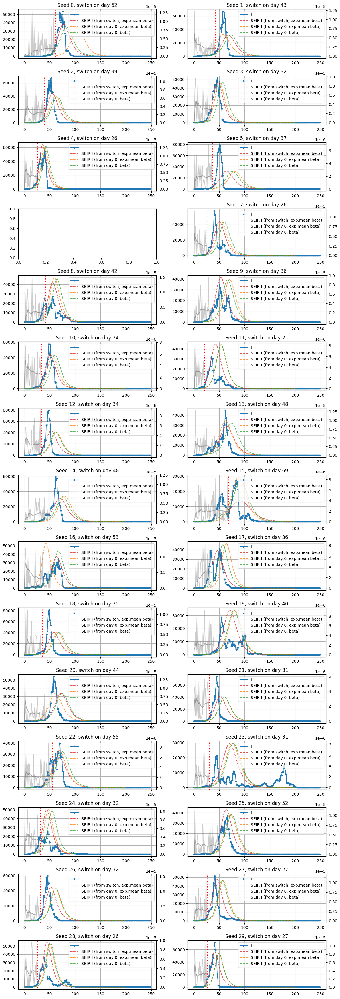

In [18]:
fig, axes = plt.subplots(15, 2, figsize=(12, 35))
axes = axes.flatten()

days_before = 14

for i, seed in enumerate(np.arange(0,30)):
    ax = axes[i]
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')

    fin = 200#df_b[df_b['I_H1N1']==0].index[0]
    st_day = df_b.I_H1N1.argmax() - days_before
    
    if st_day > 0:
        ax.axvline(st_day, ls=':', color='red')
        ax.plot(df_b.I_H1N1, label='I', color='tab:blue', marker='.')

        ax_beta = ax.twinx()
        #betas = df_b.beta_H1N1[:st_day]
        betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
        ax_beta.plot(betas[:st_day], color='gray', alpha=0.4, label='beta from df')

        beta_expand_m = betas[:st_day].expanding().mean()
        ax_beta.plot(beta_expand_m, color='gray',  label='beta expanding mean', alpha=0.7)

        #beta_roll_m = betas[:st_day].rolling(7).mean()
        #ax_beta.plot(beta_roll_m, color='gray', ls='--', label='beta rolling mean', alpha=0.7)

        y0 = df_b.iloc[st_day,:4].values
        ts = np.arange(fin-st_day)
        sigma=1/2
        gamma=1/8

        S,E,I,R = seir_discrete.seir_model(y0, ts, beta_expand_m.values[-1], sigma, gamma, 
                             stype='d', beta_t=False).T
        ax.plot(ts+st_day, I, color='tab:red', ls='--', alpha=0.8, 
                label='SEIR I (from switch, exp.mean beta)')
        
        
        # если начало строить на основе реальных бет -- ближе к правде 
        in_days = st_day
        in_days = 200
        ts = np.arange(in_days)
        y0 = df_b.iloc[0,:4].values
        
        expmean = betas.expanding().mean().iloc[:st_day].values
        S,E,I,R = seir_discrete.seir_model(y0, ts, 
                                           [*expmean,*[beta_expand_m.iloc[-1]]*(in_days-st_day)], 
                                           sigma, gamma, stype='d', beta_t=True).T
        ax.plot(np.arange(in_days), I, color='tab:orange', ls='--', alpha=0.8, 
                label='SEIR I (from day 0, exp.mean beta)')


        expmean = betas.iloc[:st_day].values
        S,E,I,R = seir_discrete.seir_model(y0, ts, 
                                           [*expmean,*[beta_expand_m.iloc[-1]]*(in_days-st_day)], 
                                           sigma, gamma, stype='d', beta_t=True).T
        ax.plot(np.arange(in_days), I, color='tab:green', ls='--', alpha=0.8, 
                label='SEIR I (from day 0, beta)')
        
        
        ax.legend()    
        ax.grid()

        ax.set_title(f'Seed {seed}, switch on day {st_day}')
    
fig.tight_layout()

In [220]:
from scipy.spatial import ConvexHull

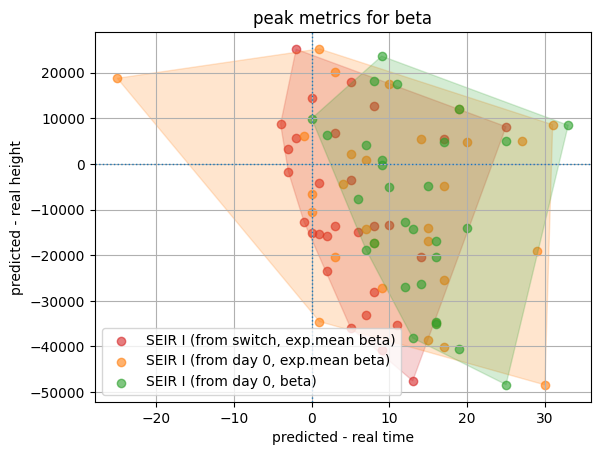

In [236]:
days_before = 14
sigma=1/2
gamma=1/8

plt.axhline(0, lw=1, ls=':')
plt.axvline(0, lw=1, ls=':')

pt_1, ph_1 = [], []
pt_2, ph_2 = [], []
pt_3, ph_3 = [], []

for i, seed in enumerate(np.arange(0,30)):
        
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')
    
    fin = 200#df_b[df_b['I_H1N1']==0].index[0]

    st_day = df_b.I_H1N1.argmax() - days_before
    
    if st_day > 0:
        betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
        beta_expand_m = betas[:st_day].expanding().mean()
        
        real_peakt = df_b.I_H1N1.argmax()
        real_peakh = df_b.I_H1N1.max()
        
        # ________ SEIR from switch day
        y0 = df_b.iloc[st_day,:4].values
        ts = np.arange(fin-st_day)
        S,E,I,R = seir_discrete.seir_model(y0, ts, beta_expand_m.iloc[-1], 
                                           sigma, gamma, stype='d', beta_t=False).T
        
        predictid_peakt = I.argmax()+st_day
        predictid_peakh = I.max()

        pt = predictid_peakt-real_peakt
        ph = predictid_peakh-real_peakh
        pt_1.append(pt)
        ph_1.append(ph)
        
        # ________ SEIR from day 0, exp.mean
        y0 = df_b.iloc[0,:4].values
        ts = np.arange(fin)
        expmean = beta_expand_m.values
        S,E,I,R = seir_discrete.seir_model(y0, ts, 
                                           [*expmean,*[beta_expand_m.iloc[-1]]*(fin-st_day)], 
                                           sigma, gamma, stype='d', beta_t=True).T
        predictid_peakt = I.argmax()
        predictid_peakh = I.max()
        pt = predictid_peakt-real_peakt
        ph = predictid_peakh-real_peakh
        pt_2.append(pt)
        ph_2.append(ph)
        
        # ________ SEIR from day 0, real beta [:st_day]
        y0 = df_b.iloc[0,:4].values
        ts = np.arange(fin)
        expmean = betas.iloc[:st_day].values
        S,E,I,R = seir_discrete.seir_model(y0, ts, 
                                           [*expmean,*[beta_expand_m.iloc[-1]]*(fin-st_day)], 
                                           sigma, gamma, stype='d', beta_t=True).T

        predictid_peakt = I.argmax()
        predictid_peakh = I.max()
        pt = predictid_peakt-real_peakt
        ph = predictid_peakh-real_peakh
        pt_3.append(pt)
        ph_3.append(ph)
        


for pt_val, ph_val, color, label in zip([pt_1,pt_2,pt_3],
                                        [ph_1,ph_2,ph_3],
                                        ['tab:red','tab:orange','tab:green'],
                                        ['SEIR I (from switch, exp.mean beta)',
                                         'SEIR I (from day 0, exp.mean beta)',
                                         'SEIR I (from day 0, beta)']):
    pt = pd.Series(pt_val)
    ph = pd.Series(ph_val)
    plt.scatter(pt, ph, color=color, alpha = 0.6, label=label)
    
    hull = ConvexHull(pd.concat([pt,ph], axis=1))
    plt.fill(pt.iloc[hull.vertices], 
                 ph.iloc[hull.vertices], alpha=0.2, color=color)

plt.grid()
plt.xlabel('predicted - real time')
plt.ylabel('predicted - real height')
plt.title('peak metrics for beta')
plt.legend()

## with real beta. just checking

### old beta from abm

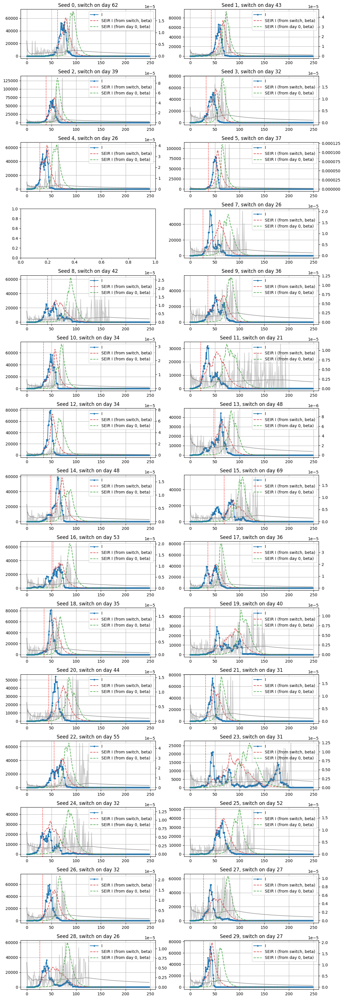

In [201]:
fig, axes = plt.subplots(15, 2, figsize=(12, 35))
axes = axes.flatten()

days_before = 14
sigma=1/2
gamma=1/8
        
for i, seed in enumerate(np.arange(0,30)):
    ax = axes[i]
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')

    fin = 200#df_b[df_b['I_H1N1']==0].index[0]
    st_day = df_b.I_H1N1.argmax() - days_before
    
    if st_day > 0:
        ax.axvline(st_day, ls=':', color='red')
        ax.plot(df_b.I_H1N1, label='I', color='tab:blue', marker='.')

        ax_beta = ax.twinx()
        betas = df_b.beta_H1N1
        #betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
        ax_beta.plot(betas, color='gray', alpha=0.4, label='beta from df')

        beta_expand_m = betas.expanding().mean()
        ax_beta.plot(beta_expand_m, color='gray',  label='beta expanding mean', alpha=0.7)

        y0 = df_b.iloc[st_day,:4].values
        ts = np.arange(fin-st_day)


        S,E,I,R = seir_discrete.seir_model(y0, ts, betas.iloc[st_day:].values, sigma, gamma, 
                             stype='d', beta_t=True).T
        ax.plot(ts+st_day, I, color='tab:red', ls='--', alpha=0.8, 
                label='SEIR I (from switch, beta)')
        
        
        # если начало строить на основе реальных бет -- ближе к правде 
        in_days = st_day
        in_days = 200
        ts = np.arange(in_days)
        y0 = df_b.iloc[0,:4].values
        
        S,E,I,R = seir_discrete.seir_model(y0, ts, 
                                           betas.iloc[:in_days].values, 
                                           sigma, gamma, stype='d', beta_t=True).T
        ax.plot(np.arange(in_days), I, color='tab:green', ls='--', alpha=0.8, 
                label='SEIR I (from day 0, beta)')
        
        
        ax.legend()    
        ax.grid()
        ax.set_title(f'Seed {seed}, switch on day {st_day}')
    
fig.tight_layout()

Text(0.5, 1.0, 'peak metrics for old ABM beta')

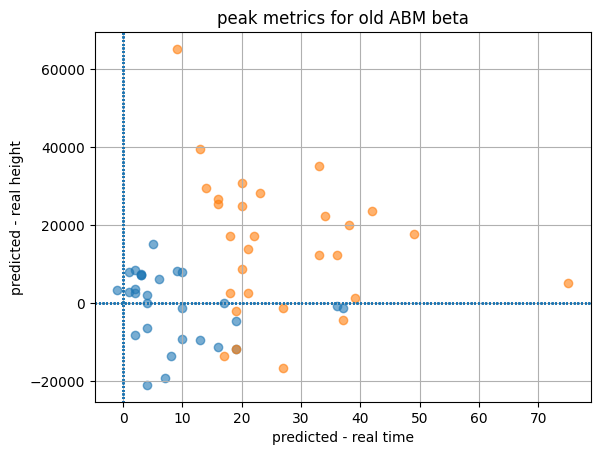

In [209]:
days_before = 14
sigma=1/2
gamma=1/8

for i, seed in enumerate(np.arange(0,30)):
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')
    
    fin = 200#df_b[df_b['I_H1N1']==0].index[0]

    st_day = df_b.I_H1N1.argmax() - days_before
    
    if st_day > 0:
        betas = df_b.beta_H1N1

        y0 = df_b.iloc[st_day,:4].values
        ts = np.arange(fin-st_day)
        

        S,E,I,R = seir_discrete.seir_model(y0, ts, betas.values[st_day:], 
                                           sigma, gamma, stype='d', beta_t=True).T

        real_peakt = df_b.I_H1N1.argmax()
        predictid_peakt = I.argmax()+st_day

        real_peakh = df_b.I_H1N1.max()
        predictid_peakh = I.max()

        plt.axhline(0, lw=1, ls=':')
        plt.axvline(0, lw=1, ls=':')
        
        
        plt.scatter(predictid_peakt-real_peakt, predictid_peakh-real_peakh,
                   color='tab:blue', alpha = 0.6)
        
        y0 = df_b.iloc[0,:4].values
        ts = np.arange(fin)

        S,E,I,R = seir_discrete.seir_model(y0, ts, betas.values[:fin], 
                                           sigma, gamma, stype='d', beta_t=True).T

        predictid_peakt = I.argmax()
        predictid_peakh = I.max()
        plt.scatter(predictid_peakt-real_peakt, predictid_peakh-real_peakh,
                   color='tab:orange', alpha = 0.6)
        
plt.grid()
plt.xlabel('predicted - real time')
plt.ylabel('predicted - real height')
plt.title('peak metrics for old ABM beta')

### recalc beta

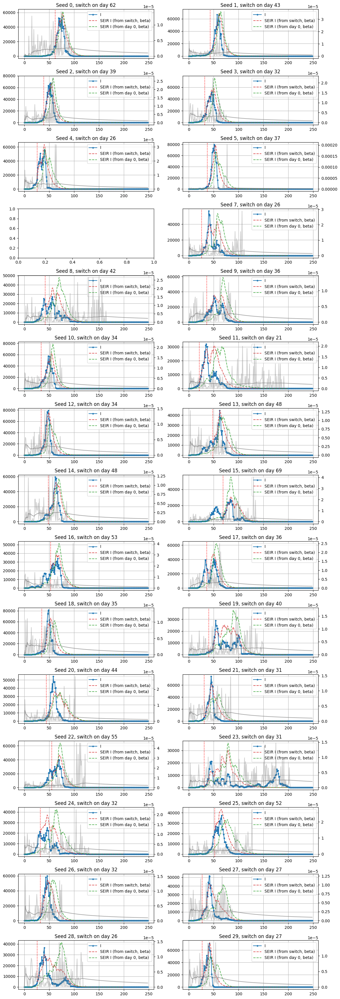

In [202]:
fig, axes = plt.subplots(15, 2, figsize=(12, 35))
axes = axes.flatten()

days_before = 14
sigma=1/2
gamma=1/8
        
for i, seed in enumerate(np.arange(0,30)):
    ax = axes[i]
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')

    fin = 200#df_b[df_b['I_H1N1']==0].index[0]
    st_day = df_b.I_H1N1.argmax() - days_before
    
    if st_day > 0:
        ax.axvline(st_day, ls=':', color='red')
        ax.plot(df_b.I_H1N1, label='I', color='tab:blue', marker='.')

        ax_beta = ax.twinx()
        betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
        ax_beta.plot(betas, color='gray', alpha=0.4, label='beta from df')

        beta_expand_m = betas.expanding().mean()
        ax_beta.plot(beta_expand_m, color='gray',  label='beta expanding mean', alpha=0.7)

        y0 = df_b.iloc[st_day,:4].values
        ts = np.arange(fin-st_day)


        S,E,I,R = seir_discrete.seir_model(y0, ts, betas.iloc[st_day:].values, sigma, gamma, 
                             stype='d', beta_t=True).T
        ax.plot(ts+st_day, I, color='tab:red', ls='--', alpha=0.8, 
                label='SEIR I (from switch, beta)')
        
        
        # если начало строить на основе реальных бет -- ближе к правде 
        in_days = st_day
        in_days = 200
        ts = np.arange(in_days)
        y0 = df_b.iloc[0,:4].values
        
        S,E,I,R = seir_discrete.seir_model(y0, ts, 
                                           betas.iloc[:in_days].values, 
                                           sigma, gamma, stype='d', beta_t=True).T
        ax.plot(np.arange(in_days), I, color='tab:green', ls='--', alpha=0.8, 
                label='SEIR I (from day 0, beta)')
        
        
        ax.legend()    
        ax.grid()
        ax.set_title(f'Seed {seed}, switch on day {st_day}')
    
fig.tight_layout()

Text(0.5, 1.0, 'peak metrics for recalc ABM beta')

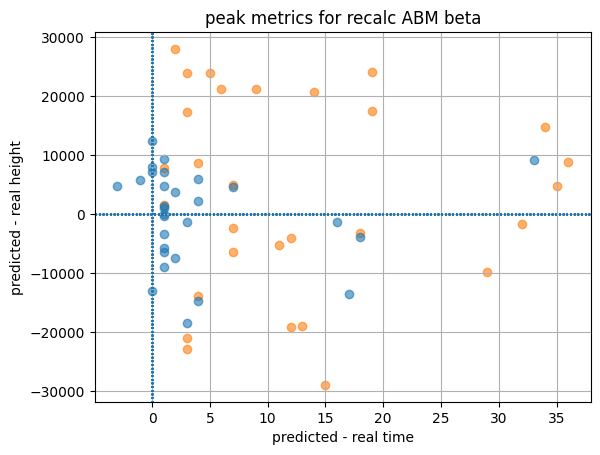

In [211]:
days_before = 14
sigma=1/2
gamma=1/8

for i, seed in enumerate(np.arange(0,30)):
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')
    
    fin = 200#df_b[df_b['I_H1N1']==0].index[0]

    st_day = df_b.I_H1N1.argmax() - days_before
    
    if st_day > 0:
        betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)

        y0 = df_b.iloc[st_day,:4].values
        ts = np.arange(fin-st_day)
        

        S,E,I,R = seir_discrete.seir_model(y0, ts, betas.values[st_day:], 
                                           sigma, gamma, stype='d', beta_t=True).T

        real_peakt = df_b.I_H1N1.argmax()
        predictid_peakt = I.argmax()+st_day

        real_peakh = df_b.I_H1N1.max()
        predictid_peakh = I.max()

        plt.axhline(0, lw=1, ls=':')
        plt.axvline(0, lw=1, ls=':')
        
        
        plt.scatter(predictid_peakt-real_peakt, predictid_peakh-real_peakh,
                   color='tab:blue', alpha = 0.6)
        
        y0 = df_b.iloc[0,:4].values
        ts = np.arange(fin)

        S,E,I,R = seir_discrete.seir_model(y0, ts, betas.values[:fin], 
                                           sigma, gamma, stype='d', beta_t=True).T

        predictid_peakt = I.argmax()
        predictid_peakh = I.max()
        plt.scatter(predictid_peakt-real_peakt, predictid_peakh-real_peakh,
                   color='tab:orange', alpha = 0.6)
        
plt.grid()
plt.xlabel('predicted - real time')
plt.ylabel('predicted - real height')
plt.title('peak metrics for recalc ABM beta')

### recalc beta, exp.mean

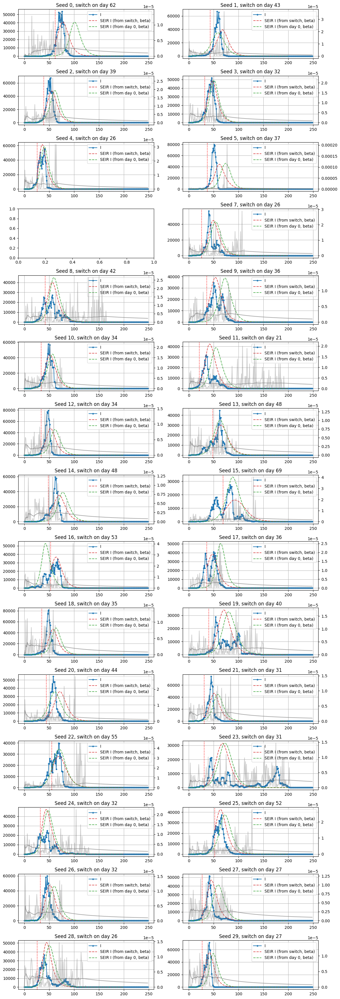

In [199]:
fig, axes = plt.subplots(15, 2, figsize=(12, 35))
axes = axes.flatten()

days_before = 14
sigma=1/2
gamma=1/8
        
for i, seed in enumerate(np.arange(0,30)):
    ax = axes[i]
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')

    fin = 200#df_b[df_b['I_H1N1']==0].index[0]
    st_day = df_b.I_H1N1.argmax() - days_before
    
    if st_day > 0:
        ax.axvline(st_day, ls=':', color='red')
        ax.plot(df_b.I_H1N1, label='I', color='tab:blue', marker='.')

        ax_beta = ax.twinx()
        #betas = df_b.beta_H1N1[:st_day]
        betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
        ax_beta.plot(betas, color='gray', alpha=0.4, label='beta from df')

        beta_expand_m = betas.expanding().mean()
        ax_beta.plot(beta_expand_m, color='gray',  label='beta expanding mean', alpha=0.7)

        y0 = df_b.iloc[st_day,:4].values
        ts = np.arange(fin-st_day)


        S,E,I,R = seir_discrete.seir_model(y0, ts, beta_expand_m.iloc[st_day:].values, sigma, gamma, 
                             stype='d', beta_t=True).T
        ax.plot(ts+st_day, I, color='tab:red', ls='--', alpha=0.8, 
                label='SEIR I (from switch, beta)')
        
        
        # если начало строить на основе реальных бет -- ближе к правде 
        in_days = st_day
        in_days = 200
        ts = np.arange(in_days)
        y0 = df_b.iloc[0,:4].values
        
        S,E,I,R = seir_discrete.seir_model(y0, ts, 
                                           beta_expand_m.iloc[:in_days].values, 
                                           sigma, gamma, stype='d', beta_t=True).T
        ax.plot(np.arange(in_days), I, color='tab:green', ls='--', alpha=0.8, 
                label='SEIR I (from day 0, beta)')
        
        
        ax.legend()    
        ax.grid()
        ax.set_title(f'Seed {seed}, switch on day {st_day}')
    
fig.tight_layout()

Text(0.5, 1.0, 'peak metrics for recalc ABM beta, exp.mean')

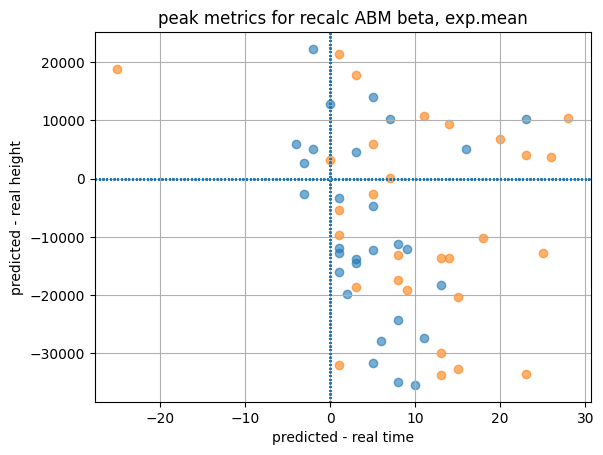

In [214]:
days_before = 14
sigma=1/2
gamma=1/8

for i, seed in enumerate(np.arange(0,30)):
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')
    
    fin = 200#df_b[df_b['I_H1N1']==0].index[0]

    st_day = df_b.I_H1N1.argmax() - days_before
    
    if st_day > 0:
        betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
        beta_expand_m = betas.expanding().mean()
        
        y0 = df_b.iloc[st_day,:4].values
        ts = np.arange(fin-st_day)
    
        S,E,I,R = seir_discrete.seir_model(y0, ts, beta_expand_m.values[st_day:], 
                                           sigma, gamma, stype='d', beta_t=True).T

        real_peakt = df_b.I_H1N1.argmax()
        predictid_peakt = I.argmax()+st_day

        real_peakh = df_b.I_H1N1.max()
        predictid_peakh = I.max()

        plt.axhline(0, lw=1, ls=':')
        plt.axvline(0, lw=1, ls=':')
        
        
        plt.scatter(predictid_peakt-real_peakt, predictid_peakh-real_peakh,
                   color='tab:blue', alpha = 0.6)
        
        y0 = df_b.iloc[0,:4].values
        ts = np.arange(fin)

        S,E,I,R = seir_discrete.seir_model(y0, ts, beta_expand_m.values[:fin], 
                                           sigma, gamma, stype='d', beta_t=True).T

        predictid_peakt = I.argmax()
        predictid_peakh = I.max()
        plt.scatter(predictid_peakt-real_peakt, predictid_peakh-real_peakh,
                   color='tab:orange', alpha = 0.6)
        
plt.grid()
plt.xlabel('predicted - real time')
plt.ylabel('predicted - real height')
plt.title('peak metrics for recalc ABM beta, exp.mean')

## stuff

In [164]:
np.sum([S_all.median(axis=1)[st_day], E_all.median(axis=1)[st_day],
inf_all.median(axis=1)[st_day], R_all.median(axis=1)[st_day]])

199056.0

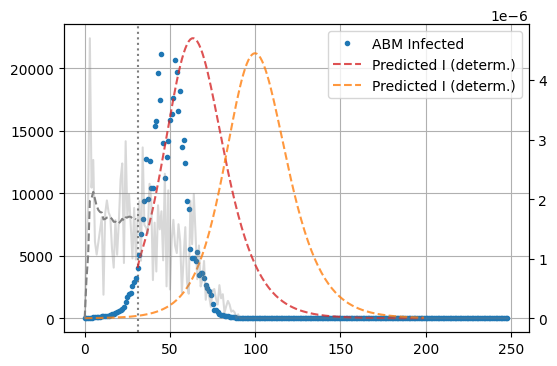

In [56]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

seed = 0
days_before = 14

fin = 200#df_b[df_b['I_H1N1']==0].index[0]
st_day = inf_all.median(axis=1).argmax() - days_before

ax.axvline(st_day, ls=':', color='tab:gray')
#betas = df_b.beta_H1N1.fillna(0)

betas = beta_all.median(axis=1)
beta_expand_m = betas[:st_day].expanding().mean()
ax.plot(inf_all.median(axis=1), label='ABM Infected', color='tab:blue', marker='.', ls='');

ax_b = ax.twinx()
ax_b.plot(betas, color='gray', alpha=0.3)
ax_b.plot(beta_expand_m, color='gray', ls='--')

# делаем SEIR прогноз

y0 = [S_all.median(axis=1)[st_day], E_all.median(axis=1)[st_day],
      inf_all.median(axis=1)[st_day], R_all.median(axis=1)[st_day]]
ts = np.arange(fin-st_day)
sigma=1/2
gamma=1/8

S,E,I,R = seir_discrete.seir_model(y0, ts, beta_expand_m.iloc[-1], sigma, gamma, 
                         stype='d', beta_t=False).T
ax.plot(ts+st_day, I, color='tab:red', ls='--', alpha=0.8, 
            label='Predicted I (determ.)')

in_days = st_day
in_days = 200
ts = np.arange(in_days)
y0 = df_b.iloc[0,:4].values

# если начало строить на основе реальных бет -- +- одно и то же
expmean = betas.expanding().mean().iloc[:st_day].values
#expmean = df_b.beta_H1N1.iloc[:st_day].values
S,E,I,R = seir_discrete.seir_model(y0, ts, 
                                   [*expmean,*[beta_expand_m.iloc[-1]]*(in_days-st_day)], 
                                   sigma, gamma, stype='d', beta_t=True).T
ax.plot(np.arange(in_days), I, color='tab:orange', ls='--', alpha=0.8, 
        label='Predicted I (determ.)')
ax.legend()
ax.grid()

### recalc and prev. beta for 1 seed

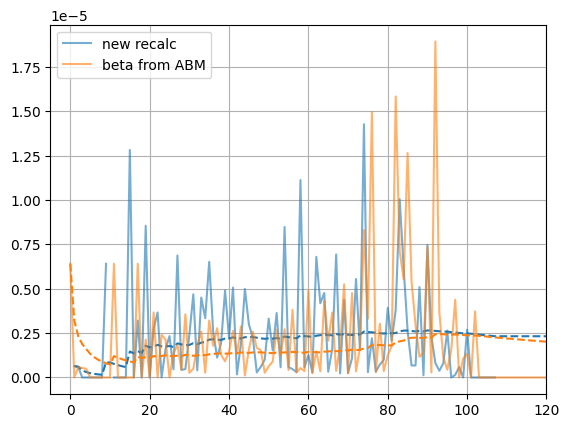

In [143]:
plt.plot(- df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1),
        label='new recalc', alpha=0.6, color='tab:blue')
plt.plot((- df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)
         ).expanding(1).mean(), ls='--', color='tab:blue')

plt.plot(df_b.beta_H1N1, color='tab:orange', alpha=0.6,
         label='beta from ABM')
plt.plot(df_b.beta_H1N1.expanding(1).mean(), color='tab:orange', 
         ls='--')
plt.xlim(-5, 120)
plt.legend()
plt.grid()

## metrics for exp.mean Beta (recalculated!)

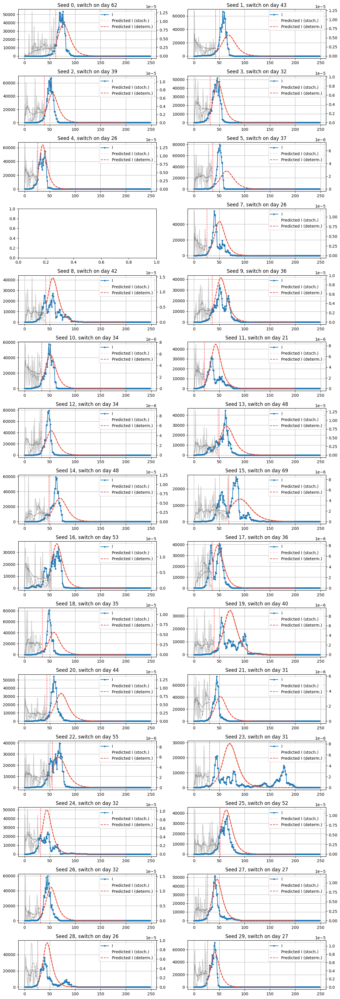

In [117]:
fig, axes = plt.subplots(15, 2, figsize=(12, 35))
axes = axes.flatten()

days_before = 14

for i, seed in enumerate(np.arange(0,30)):
    ax = axes[i]
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')

    
    fin = 200#df_b[df_b['I_H1N1']==0].index[0]
    
    st_day = df_b.I_H1N1.argmax() - days_before
    if st_day > 0:
    
        ax.axvline(st_day, ls=':', color='red')
        ax.plot(df_b.I_H1N1, label='I', color='tab:blue', marker='.')

        ax_beta = ax.twinx()
         #betas = df_b.beta_H1N1[:st_day]
        betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
        ax_beta.plot(betas[:st_day], color='gray', alpha=0.4, label='beta from df')

        beta_expand_m = betas[:st_day].expanding().mean()
        ax_beta.plot(beta_expand_m, color='gray',  label='beta expanding mean', alpha=0.7)

        beta_roll_m = betas[:st_day].rolling(7).mean()
        ax_beta.plot(beta_roll_m, color='gray', ls='--', label='beta rolling mean', alpha=0.7)


        y0 = df_b.iloc[st_day,:4].values
        ts = np.arange(fin-st_day)
        sigma=1/2
        gamma=1/8

        betas = betas.values[-1]
        betas = beta_expand_m.values[-1]
        #betas = beta_roll_m.values[-1]
        for i in range(15):
            if i==0:
                label='Predicted I (stoch.)'
            else:
                label=''
            S,E,I,R = seir_discrete.seir_model(y0, ts, betas, sigma, gamma, 
                                  stype='stoch', beta_t=False).T

            ax.plot(ts+st_day, I, color='coral', ls='--', alpha=0.3, label=label)


        S,E,I,R = seir_discrete.seir_model(y0, ts, betas, sigma, gamma, 
                             stype='d', beta_t=False).T
        ax.plot(ts+st_day, I, color='tab:red', ls='--', alpha=0.8, 
                label='Predicted I (determ.)')

        ax.legend()    
        ax.grid()

        ax.set_title(f'Seed {seed}, switch on day {st_day}')
    
fig.tight_layout()

Text(0.5, 1.0, 'peak metrics for expanding mean beta')

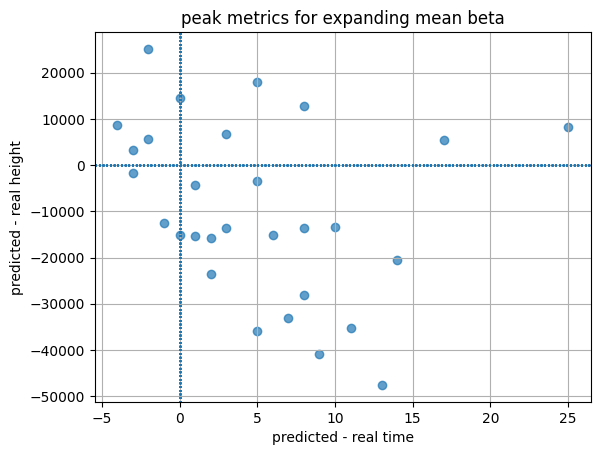

In [53]:
days_before = 14

for i, seed in enumerate(np.arange(0,30)):
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')
    
    fin = 200#df_b[df_b['I_H1N1']==0].index[0]

    st_day = df_b.I_H1N1.argmax() - days_before
    
    if st_day > 0:
        #betas = df_b.beta_H1N1[:st_day]
        betas = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
        betas = betas[:st_day]

        beta_expand_m = betas[:st_day].expanding().mean()

        y0 = df_b.iloc[st_day,:4].values
        ts = np.arange(fin-st_day)
        sigma=1/2
        gamma=1/8

        betas = betas.values[-1]
        betas = beta_expand_m.values[-1]
        #betas = beta_roll_m.values[-1]

        S,E,I,R = seir_discrete.seir_model(y0, ts, betas, sigma, gamma, 
                             stype='d', beta_t=False).T

        real_peakt = df_b.I_H1N1.argmax()
        predictid_peakt = I.argmax()+st_day

        real_peakh = df_b.I_H1N1.max()
        predictid_peakh = I.max()

        plt.axhline(0, lw=1, ls=':')
        plt.axvline(0, lw=1, ls=':')
        plt.scatter(predictid_peakt-real_peakt, predictid_peakh-real_peakh, 
                    color='tab:blue',alpha=0.7)
plt.grid()
plt.xlabel('predicted - real time')
plt.ylabel('predicted - real height')
plt.title('peak metrics for expanding mean beta')

In [111]:
real_peakt, predictid_peakt

(41, 45)

In [48]:
inf_all.median(axis=1)#.values[st_day:fin]

0      10.0
1      10.0
2      20.0
3      29.0
4      38.0
       ... 
244     0.0
245     0.0
246     0.0
247     0.0
248     0.0
Length: 249, dtype: float64

In [89]:
df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{20}.csv', 
            sep='\t')
df_b.I_H1N1.argmax()

58

## metrics for median beta

1
3
5
7
9
10
11
12
14
18
19
20
21
23
26
27
28


Text(0.5, 1.0, 'peak metrics for median beta')

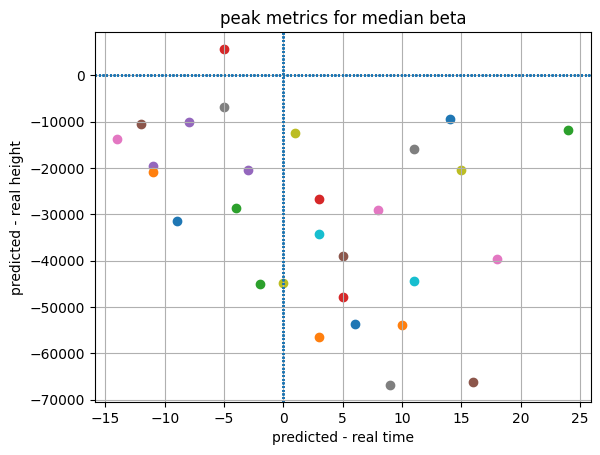

In [128]:
days_before = 14

for i, seed in enumerate(np.arange(0,30)):
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')
    
    fin = 200#df_b[df_b['I_H1N1']==0].index[0]

    st_day = df_b.I_H1N1.argmax() - days_before
    if st_day > 0:


        y0 = df_b.iloc[st_day,:4].values
        ts = np.arange(fin-st_day)
        sigma=1/2
        gamma=1/8

        betas = beta_all.median(axis=1).values[st_day:fin]

        S,E,I,R = seir_discrete.seir_model(y0, ts, betas, sigma, gamma, 
                             stype='d', beta_t=True).T

        real_peakt = df_b.I_H1N1.argmax()
        predictid_peakt = I.argmax()+st_day

        real_peakh = df_b.I_H1N1.max()
        predictid_peakh = I.max()

        plt.axhline(0, lw=1, ls=':')
        plt.axvline(0, lw=1, ls=':')
        plt.scatter(predictid_peakt-real_peakt, predictid_peakh-real_peakh)
        if (predictid_peakt-real_peakt > 0)&(predictid_peakh-real_peakh<0):
            print(seed)
plt.grid()
plt.xlabel('predicted - real time')
plt.ylabel('predicted - real height')
plt.title('peak metrics for median beta')

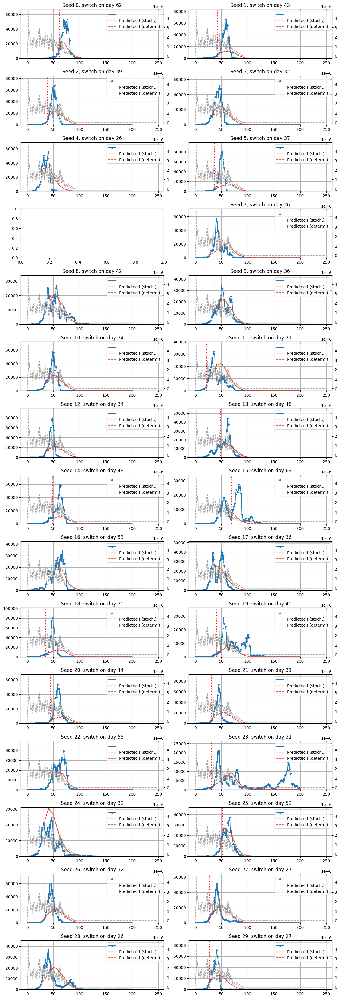

In [129]:
fig, axes = plt.subplots(15, 2, figsize=(12, 35))
axes = axes.flatten()

days_before = 14

for i, seed in enumerate(np.arange(0,30)):
    ax = axes[i]
    df_b = pd.read_csv(f'sampled_200k_res/seirb_seed_{seed}.csv', 
            sep='\t')

    
    fin = 200#df_b[df_b['I_H1N1']==0].index[0]
    
    st_day = df_b.I_H1N1.argmax() - days_before
    if st_day > 0:
    
        ax.axvline(st_day, ls=':', color='red')
        ax.plot(df_b.I_H1N1.iloc[:fin], label='I', color='tab:blue', marker='.')

        ax_beta = ax.twinx()

        ax_beta.plot(beta_all.median(axis=1), color='gray', 
                     ls='--', label='beta median', alpha=0.7)


        y0 = df_b.iloc[st_day,:4].values
        ts = np.arange(fin-st_day)
        sigma=1/2
        gamma=1/8

        #betas = beta_roll_m.values[-1]
        betas = beta_all.median(axis=1).values[st_day:fin]
        for i in range(15):
            if i==0:
                label='Predicted I (stoch.)'
            else:
                label=''
            S,E,I,R = seir_discrete.seir_model(y0, ts, betas, sigma, gamma, 
                                  stype='stoch', beta_t=True).T

            ax.plot(ts+st_day, I, color='coral', ls='--', alpha=0.3, label=label)


        S,E,I,R = seir_discrete.seir_model(y0, ts, betas, sigma, gamma, 
                             stype='d', beta_t=True).T
        ax.plot(ts+st_day, I, color='tab:red', ls='--', alpha=0.8, 
                label='Predicted I (determ.)')

        ax.legend()    
        ax.grid()

        ax.set_title(f'Seed {seed}, switch on day {st_day}')
        ax.set_ylim(-5, df_b.I_H1N1.max()*1.25)
    
fig.tight_layout()

In [42]:
st_day, fin-st_day

(62, 138)

In [37]:
inf_all.median(axis=1)

0      10.0
1      10.0
2      20.0
3      29.0
4      38.0
       ... 
244     0.0
245     0.0
246     0.0
247     0.0
248     0.0
Length: 249, dtype: float64